<a href="https://colab.research.google.com/github/turagsarkar/Analysis-of-the-Datasets-Electrical-Grid-Stability-Simulated/blob/main/Analysis_of_the_Datasets_Electrical_Grid_Stability_Simulated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [26]:
#import libaray
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [27]:
#import dataset
df=pd.read_csv("/content/Data_for_UCI_named.csv")
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,unstable
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,stable
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,unstable
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,unstable
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,unstable


In [28]:
#dataset information
df.describe()
df.info()
df.dtypes

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   tau1    10000 non-null  float64
 1   tau2    10000 non-null  float64
 2   tau3    10000 non-null  float64
 3   tau4    10000 non-null  float64
 4   p1      10000 non-null  float64
 5   p2      10000 non-null  float64
 6   p3      10000 non-null  float64
 7   p4      10000 non-null  float64
 8   g1      10000 non-null  float64
 9   g2      10000 non-null  float64
 10  g3      10000 non-null  float64
 11  g4      10000 non-null  float64
 12  stab    10000 non-null  float64
 13  stabf   10000 non-null  object 
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


tau1     float64
tau2     float64
tau3     float64
tau4     float64
p1       float64
p2       float64
p3       float64
p4       float64
g1       float64
g2       float64
g3       float64
g4       float64
stab     float64
stabf     object
dtype: object

In [29]:
#data preprocessing
#fininding null value
df.isnull().sum()

tau1     0
tau2     0
tau3     0
tau4     0
p1       0
p2       0
p3       0
p4       0
g1       0
g2       0
g3       0
g4       0
stab     0
stabf    0
dtype: int64

In [30]:
#finding the unique value
for i in df.columns:
    print(df[i].unique())

[2.95906002 9.30409723 8.97170691 ... 2.36403419 9.63151069 6.53052662]
[3.0798852  4.90252411 8.84842842 ... 2.84203025 3.9943976  6.7817899 ]
[8.38102539 3.04754073 3.04647875 ... 8.77639096 2.75707093 4.34969522]
[9.78075443 1.36935736 1.21451814 ... 1.00890638 7.82134718 8.6731382 ]
[3.76308477 5.0678121  3.40515818 ... 4.29997561 2.51475476 3.49280713]
[-0.78260363 -1.94005843 -1.20745559 ... -1.38071867 -0.96632962
 -1.39028526]
[-1.25739483 -1.87274169 -1.27721015 ... -0.94388423 -0.64991475
 -1.53219258]
[-1.72308631 -1.25501199 -0.92049244 ... -1.97537271 -0.89851038
 -0.57032928]
[0.65045646 0.41344057 0.16304104 ... 0.4878379  0.365246   0.07305556]
[0.85957811 0.86241408 0.76668866 ... 0.98650532 0.58755755 0.50544105]
[0.88744492 0.56213905 0.83944402 ... 0.14928646 0.88911835 0.37876093]
[0.95803399 0.78175991 0.10985324 ... 0.14598403 0.81839133 0.94263083]
[ 0.05534749 -0.00595746  0.00347088 ... -0.03180989  0.03778881
  0.04526331]
['unstable' 'stable']


In [31]:
#finding duplicate value
df.duplicated().sum()

0

In [32]:
#labelEncoding
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
df["stabf"]=label_encoder.fit_transform(df["stabf"])
df.head()

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stab,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,0.055347,1
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,-0.005957,0
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,0.003471,1
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,0.028871,1
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,0.049860,1


In [33]:
#value count
df["stabf"].value_counts()

1    6380
0    3620
Name: stabf, dtype: int64

In [34]:
!pip install missingno

<Axes: >

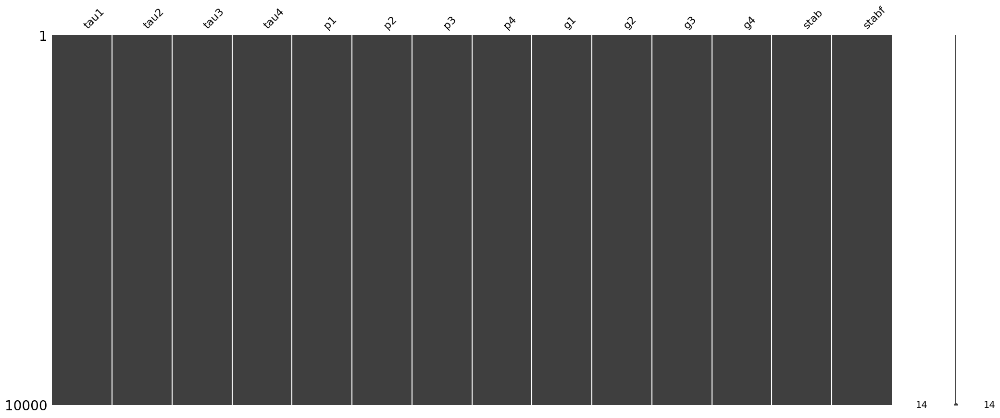

In [35]:
import missingno as msno
msno.matrix(df)

In [36]:
#drop columne
df=df.drop('stab',axis=1)
df

,tau1,tau2,tau3,tau4,p1,p2,p3,p4,g1,g2,g3,g4,stabf
0,2.959060,3.079885,8.381025,9.780754,3.763085,-0.782604,-1.257395,-1.723086,0.650456,0.859578,0.887445,0.958034,1
1,9.304097,4.902524,3.047541,1.369357,5.067812,-1.940058,-1.872742,-1.255012,0.413441,0.862414,0.562139,0.781760,0
2,8.971707,8.848428,3.046479,1.214518,3.405158,-1.207456,-1.277210,-0.920492,0.163041,0.766689,0.839444,0.109853,1
3,0.716415,7.669600,4.486641,2.340563,3.963791,-1.027473,-1.938944,-0.997374,0.446209,0.976744,0.929381,0.362718,1
4,3.134112,7.608772,4.943759,9.857573,3.525811,-1.125531,-1.845975,-0.554305,0.797110,0.455450,0.656947,0.820923,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9995,2.930406,9.487627,2.376523,6.187797,3.343416,-0.658054,-1.449106,-1.236256,0.601709,0.779642,0.813512,0.608385,1
9996,3.392299,1.274827,2.954947,6.894759,4.349512,-1.663661,-0.952437,-1.733414,0.502079,0.567242,0.285880,0.366120,0
9997,2.364034,2.842030,8.776391,1.008906,4.299976,-1.380719,-0.943884,-1.975373,0.487838,0.986505,0.149286,0.145984,0
9998,9.631511,3.994398,2.757071,7.821347,2.514755,-0.966330,-0.649915,-0.898510,0.365246,0.587558,0.889118,0.818391,1


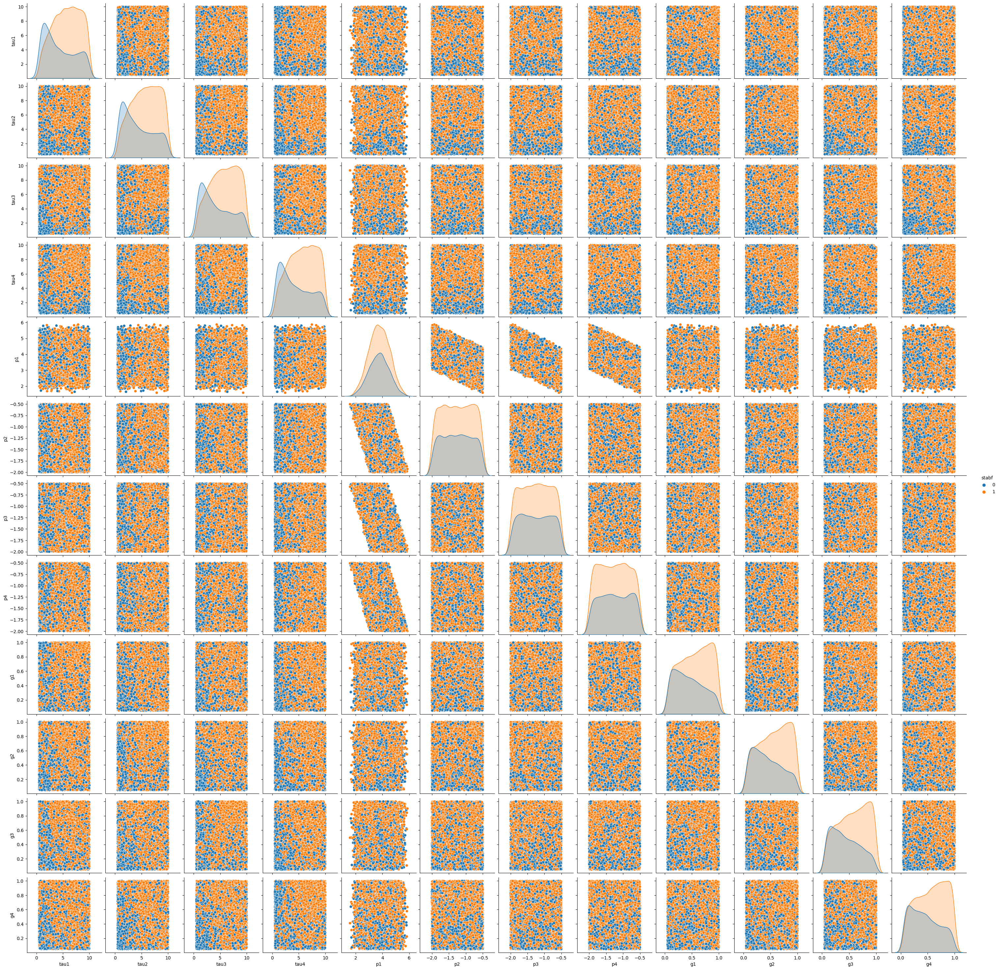

<Figure size 5000x2500 with 0 Axes>

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.pairplot(df, hue="stabf")
plt.figure(figsize=(50,25))
plt.show()

In [38]:
#feture extraction & selection
#UMAP
!pip install umap-learn

In [56]:
X=df.drop('stabf',axis=1)
y=df.stabf

In [57]:
from umap import UMAP

umap_2d = UMAP(n_components=6, init='random', random_state=42)
umap_3d = UMAP(n_components=3, init='random', random_state=42)

proj_2d = umap_2d.fit_transform(X)
proj_3d = umap_3d.fit_transform(X)

In [79]:
proj_2d

array([[3.1139534, 3.6362295, 4.5839996, 3.283044 , 4.9503555, 5.1097627],
       [6.158853 , 6.284723 , 6.4169703, 5.939977 , 5.6975493, 4.2756505],
       [7.2557044, 5.86328  , 5.325215 , 6.647577 , 5.650112 , 5.290865 ],
       ...,
       [4.531564 , 4.76288  , 4.37394  , 4.30989  , 5.390369 , 2.4432192],
       [4.3720655, 5.850322 , 7.110214 , 5.0661254, 4.6953917, 6.336264 ],
       [4.9009852, 4.6125126, 5.3312497, 5.0513973, 4.776091 , 7.2193027]],
      dtype=float32)

In [41]:
import plotly.express as px
fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=df.stabf, labels={'color': 'species'}
)

fig_2d.show()

In [ ]:
fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=df.stabf, labels={'color': 'species'}
)
fig_3d.update_traces(marker_size=5)
fig_3d.show()

In [43]:
pip install mrmr_selection

In [69]:
X_ump=proj_2d

In [70]:
X = pd.DataFrame(X_ump)
y = pd.Series(y)

In [86]:
import numpy as np
from mrmr import mrmr_classif
selected_features = mrmr_classif(X=X, y=y, K=3)

100%|██████████| 3/3 [00:00<00:00, 42.72it/s]


In [87]:
selected_features

[4, 5, 1]

In [89]:
x_mrmr=selected_features
y

0       1
1       0
2       1
3       1
4       1
       ..
9995    1
9996    0
9997    0
9998    1
9999    1
Name: stabf, Length: 10000, dtype: int64

In [91]:
#algorithum
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import ExtraTreesClassifier
clf = ExtraTreesClassifier(n_estimators=100, random_state=0)
scores =cross_val_score(clf,x_mrmr, y, cv=5)
scores

ValueError: ignored

In [ ]:
#weighted ensamble

In [ ]:
#XAI SHAP